# Predict

Here the CNN model is used to predict roads for the selected cities. The predictions are saved locally so we can refer to them in the final notebook to do some image processing.

<table><tr><td style="text-align:left">Lake Havasu City</td><td>Flagstaff</td></tr><tr><td><img src='/img/notebook/predict_havasu1.png'></td><td><img src='/img/notebook/predict_flagstaff1.png'></td></tr></table>


In [1]:
import numpy as np
import json

from metrics import *
from helpers import rio_open, rio_save, make_tiles, stitch_tiles

import tensorflow as tf
from keras import backend as K
from keras.models import load_model

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

/home/carlos/anaconda3/envs/geo/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Load up the best-performing model.

In [2]:
custom_objects = {
    'dice_coef_loss': dice_coef_loss, 
    'dice_coef': dice_coef,
    'fmeasure': fmeasure,
    'precision': precision,
    'recall': recall
}
model = load_model('models/unet_9_epoch22_loss-0.5965.hdf5', custom_objects=custom_objects)

Before we predict roads, we'll take the mosaic image of a city and split it into appropriate-sized tiles for input to the CNN.

Unlike the large training set, here it is assumed the mosaic and tiles can be stored in memory.

The mosaic range as determined by Google Maps viewport bounds is often much larger than necessary for smaller cities. So, before prediction the mosaic is cropped. Figuring out the bounds is a manual operation that takes some guess-and-check per city. The relevant bounds of the mosaics are stored in the `bounds` dictionary for each city.

In [3]:
bounds = {
    'Bullhead': np.s_[7000:, 9500:24000],
    'Lake Havasu City': np.s_[5000:21000, 11000:25000],
    'Flagstaff': np.s_[0:15000, 0:20000],
    'Globe': np.s_[5000:18000, 0:13000],
    'Tuscon': np.s_[0:38000, 0:42000],
    'Yuma': np.s_[2000:20000, 2500:]
}

With the bounds in place, we define a `predict` function which applies the model to each city and saves the result. The essential steps are

1. Split the mosaic image into tiles for the CNN
2. Apply the CNN to each tile
3. Stitch all the predictions of the CNN back into a single image
4. Save the predictions and the cropped image (we lose a few pixels on each mosaic in step 1 to ensure a whole number of 512x512 tiles)

In [4]:
def predict(
    img,
    model,
    prediction_path,
    cropped_image_path,
    pad = 64,
    batch_size = 4
):
    X, n_tiles_x, n_tiles_y = make_tiles(img, pad = pad)
    Yhat = model.predict(X, batch_size = batch_size)
    
    prediction = stitch_tiles(Yhat, n_tiles_x, n_tiles_y)
    rio_save(prediction, prediction_path)
    del prediction
    
    img_crop = stitch_tiles(X, n_tiles_x, n_tiles_y, crop = pad)
    img_crop = img_crop.astype(np.uint8)
    rio_save(img_crop, cropped_image_path)
    

In [5]:
with open('data/naip/download_info.json', 'r') as places_in:
    places = json.load(places_in)
    
for place, place_info in places.items():
    
    ## Skip some cities
    if place in ['Tuscon', 'Phoenix']: continue
    print('Processing {}'.format(place))
    
    ## Setup I/O paths
    mosaic_path = place_info['mosaic']
    prediction_path = mosaic_path.replace('/mosaic/', '/predictions/')
    cropped_img_path = mosaic_path.replace('.tif', '_crop.tif')
    place_info['predictions'] = prediction_path
    place_info['crop'] = cropped_img_path
    
    ## Crop and predict
    mosaic = rio_open(mosaic_path)
    mosaic = mosaic[bounds[place]]
    predict(mosaic, model, prediction_path, cropped_img_path) 

## Save new dictionary entries
with open('data/naip/download_info.json', 'w') as places_out:
    json.dump(places, places_out, sort_keys = True, indent = 4)

Processing Bullhead
Processing Flagstaff
Processing Globe
Processing Lake Havasu City
Processing Yuma


We can visually insepect how well the model did for each city by overlaying the predictions on the aerial images.

/home/carlos/anaconda3/envs/geo/lib/python3.6/site-packages/rasterio/__init__.py:240: NotGeoreferencedWarning: Dataset has no geotransform set. Default transform will be applied (Affine.identity())
  s = DatasetReader(fp, driver=driver, **kwargs)


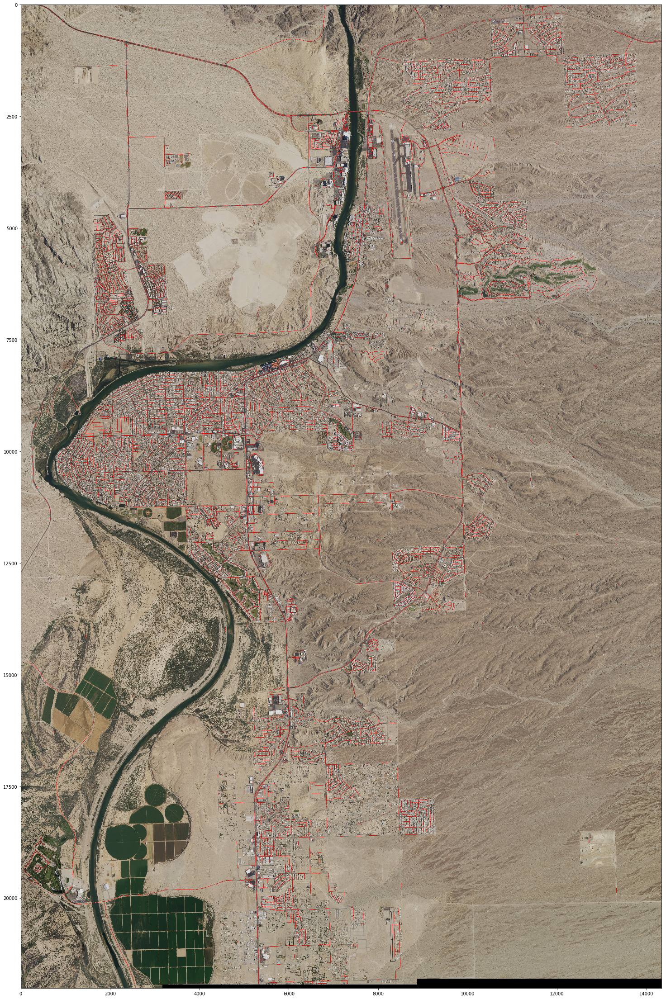

In [26]:
city = 'Bullhead'
pred_path = places[city]['predictions']
img_path = places[city]['crop']

pred = rio_open(pred_path)
pred = pred > 0.5
pred = pred[:, :, 0]

img = rio_open(img_path)
fig, ax = plt.subplots(1, 1, figsize = (40, 40))
img[pred] = (255, 0, 0)
ax.imshow(img)